In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="BYViFrhve7l5KyguwvhS")
project = rf.workspace("mobil-deteksi").project("car-bus-jihba")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to car-bus-1 in yolov11:: 100%|██████████| 2012/2012 [00:00<00:00, 4662.05it/s]


In [ ]:
import os
import gc
import time
import random
import shutil

from PIL import Image

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torch
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.ops import box_iou

from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score

import tensorflow as tf

from tqdm import tqdm

from tabulate import tabulate

In [ ]:
def copy_folder(src, dst):
    """
    Copy the contents of the source folder to the destination folder.
    Creates any necessary directories in the destination path.

    :param src: Source directory path.
    :param dst: Destination directory path.
    """
    if not os.path.exists(src):
        raise ValueError(f"Source directory does not exist: {src}")

    # Create the destination directory if it does not exist
    os.makedirs(dst, exist_ok=True)

    # Copy each item from the source to the destination
    for item in os.listdir(src):
        s = os.path.join(src, item)
        d = os.path.join(dst, item)

        if os.path.isdir(s):
            shutil.copytree(s, d, dirs_exist_ok=True)  # Copy subdirectory
        else:
            shutil.copy2(s, d)  # Copy file

In [ ]:
def convert_labels_from_yolo_format_to_pascal_voc_format(directory):
    labels_path = os.path.join(directory, 'labels')
    images_path = os.path.join(directory, 'images')

    data = []

    for label_file in os.listdir(labels_path):
        if label_file.endswith('.txt'):
            image_file = label_file.replace('.txt', '.jpg')
            image_path = os.path.join(images_path, image_file)

            # Open image to get its dimensions
            with Image.open(image_path) as img:
                image_width, image_height = img.size

            # Read the label file
            label_file_path = os.path.join(labels_path, label_file)
            with open(label_file_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    center_x = float(parts[1])
                    center_y = float(parts[2])
                    bbox_width = float(parts[3])
                    bbox_height = float(parts[4])

                    # Convert normalized coordinates to actual coordinates
                    center_x *= image_width
                    center_y *= image_height
                    bbox_width *= image_width
                    bbox_height *= image_height

                    # Calculate top-left and bottom-right coordinates
                    x1 = center_x - (bbox_width / 2)
                    y1 = center_y - (bbox_height / 2)
                    x2 = center_x + (bbox_width / 2)
                    y2 = center_y + (bbox_height / 2)

                    data.append([image_file, x1, y1, x2, y2, class_id])

    # Create DataFrame
    df = pd.DataFrame(data, columns=['image_id', 'x1', 'y1', 'x2', 'y2', 'class'])

    return df

In [ ]:
# Train data

copy_folder(src='/content/car-bus-1/train/images', dst='/content/car-bus-1/train')

train_annotations = convert_labels_from_yolo_format_to_pascal_voc_format('/content/car-bus-1/train')
train_annotations.to_csv('train_annotations.csv', index=False)

In [ ]:
train_annotations

,image_id,x1,y1,x2,y2,class
0,13bd328b8a1bda4d_jpg.rf.08c9678390a34ee27bfbae...,19.25,46.00,476.75,525.00,0
1,988e70c442a0cb96_jpg.rf.62915a59e4ba96a6bb020a...,558.50,459.25,639.50,521.75,1
2,21c5b7fa1c5d4a6b_jpg.rf.0d63ee597a339bd8a7acdd...,180.50,100.50,562.50,541.50,0
3,21c5b7fa1c5d4a6b_jpg.rf.0d63ee597a339bd8a7acdd...,558.75,335.75,584.25,412.25,1
4,21c5b7fa1c5d4a6b_jpg.rf.0d63ee597a339bd8a7acdd...,140.50,314.00,205.50,475.00,1
...,...,...,...,...,...,...
1594,811ec398bbae00e0_jpg.rf.ec70db19f2723a5b258468...,0.00,0.00,639.00,639.00,1
1595,d2011d84f2021028_jpg.rf.c3625e19818fd4977cf343...,0.00,89.00,90.00,518.00,0
1596,d2011d84f2021028_jpg.rf.c3625e19818fd4977cf343...,75.00,99.25,378.00,498.75,0
1597,d2011d84f2021028_jpg.rf.c3625e19818fd4977cf343...,620.50,369.25,639.50,414.75,1


In [ ]:
train_annotations['class'].value_counts()

,count
class,
1,1026
0,573


In [ ]:
# Test data

copy_folder(src='/content/car-bus-1/test/images', dst='/content/car-bus-1/test')

test_annotations = convert_labels_from_yolo_format_to_pascal_voc_format('/content/car-bus-1/test')
test_annotations.to_csv('test_annotations.csv', index=False)

In [ ]:
test_annotations['class'].value_counts()

,count
class,
1,200
0,72


In [ ]:
# Validation data

copy_folder(src='/content/car-bus-1/valid/images', dst='/content/car-bus-1/valid')

valid_annotations = convert_labels_from_yolo_format_to_pascal_voc_format('/content/car-bus-1/valid')
valid_annotations.to_csv('valid_annotations.csv', index=False)

In [ ]:
valid_annotations['class'].value_counts()

,count
class,
1,188
0,109


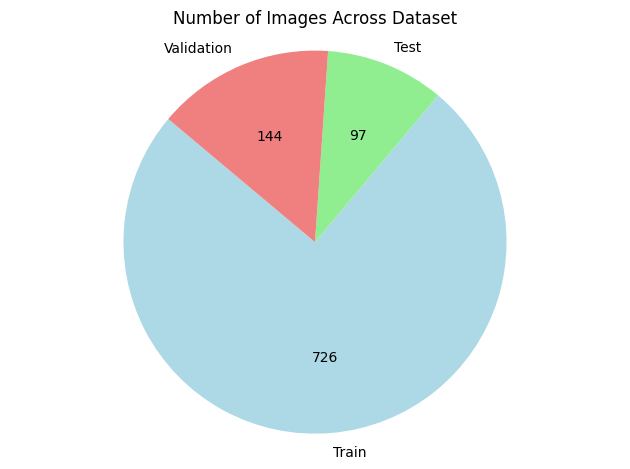

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_image_distribution(train_csv, test_csv, validation_csv):
    # Load datasets
    train_df = pd.read_csv(train_csv)
    test_df = pd.read_csv(test_csv)
    validation_df = pd.read_csv(validation_csv)

    # Calculate number of unique images in each dataset
    num_train_images = train_df['image_id'].nunique()
    num_test_images = test_df['image_id'].nunique()
    num_validation_images = validation_df['image_id'].nunique()

    # Data for pie chart
    labels = ['Train', 'Test', 'Validation']
    sizes = [num_train_images, num_test_images, num_validation_images]
    colors = ['lightblue', 'lightgreen', 'lightcoral']

    # Function to format the actual count on each pie slice
    def func(pct, allvalues):
        absolute = int(pct/100.*sum(allvalues))
        return "{:d}".format(absolute)

    # Plotting pie chart
    fig, ax = plt.subplots()
    wedges, texts, autotexts = ax.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: func(pct, sizes),
                                      startangle=140)

    # Equal aspect ratio ensures that pie is drawn as a circle.
    ax.axis('equal')
    ax.set_title('Number of Images Across Dataset')

    # Show plot
    plt.tight_layout()
    plt.show()

# Example usage with file paths
train_csv = 'train_annotations.csv'
test_csv = 'test_annotations.csv'
validation_csv = 'valid_annotations.csv'

plot_image_distribution(train_csv, test_csv, validation_csv)


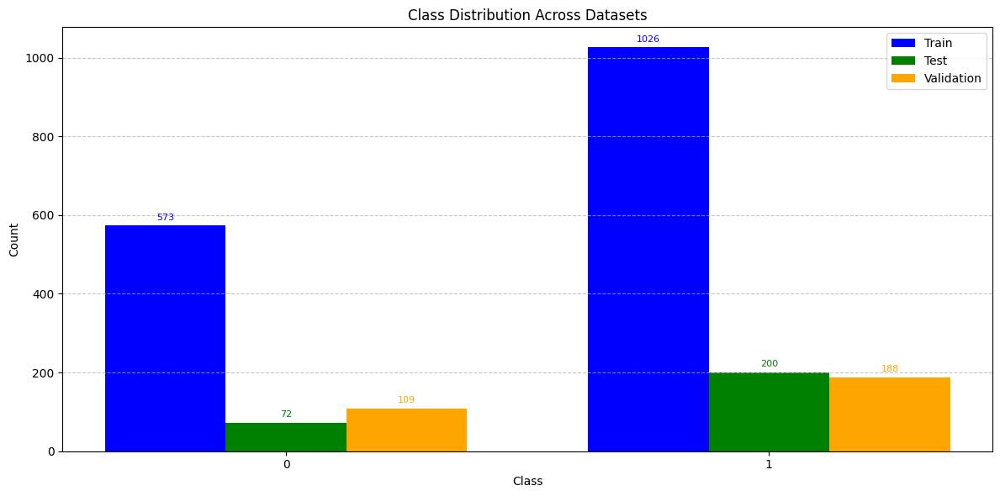

In [ ]:
def plot_class_distribution(train_csv, test_csv, validation_csv):
    # Load datasets
    train_df = pd.read_csv(train_csv)
    test_df = pd.read_csv(test_csv)
    validation_df = pd.read_csv(validation_csv)

    # Calculate class counts for each dataset
    train_counts = train_df['class'].value_counts().sort_index()
    test_counts = test_df['class'].value_counts().sort_index()
    validation_counts = validation_df['class'].value_counts().sort_index()

    # Determine unique classes across all datasets
    all_classes = sorted(set(train_counts.index) | set(test_counts.index) | set(validation_counts.index))

    # Fill missing class counts with zeros
    train_counts = train_counts.reindex(all_classes, fill_value=0)
    test_counts = test_counts.reindex(all_classes, fill_value=0)
    validation_counts = validation_counts.reindex(all_classes, fill_value=0)

    # Plotting
    fig, ax = plt.subplots(figsize=(12, 6))

    # Bar width for each dataset
    bar_width = 0.25

    # X positions for the bars
    x_train = range(len(all_classes))
    x_test = [pos + bar_width for pos in x_train]
    x_validation = [pos + bar_width*2 for pos in x_train]

    # Plot bars for each dataset
    ax.bar(x_train, train_counts.values, width=bar_width, color='blue', label='Train')
    ax.bar(x_test, test_counts.values, width=bar_width, color='green', label='Test')
    ax.bar(x_validation, validation_counts.values, width=bar_width, color='orange', label='Validation')

    # Add count numbers on top of each bar
    for xpos, counts in zip(x_train, train_counts.values):
        ax.text(xpos, counts + 10, str(counts), ha='center', va='bottom', fontsize=8, color='blue')
    for xpos, counts in zip(x_test, test_counts.values):
        ax.text(xpos, counts + 10, str(counts), ha='center', va='bottom', fontsize=8, color='green')
    for xpos, counts in zip(x_validation, validation_counts.values):
        ax.text(xpos, counts + 10, str(counts), ha='center', va='bottom', fontsize=8, color='orange')

    # X-axis labels and ticks
    ax.set_xlabel('Class')
    ax.set_ylabel('Count')
    ax.set_title('Class Distribution Across Datasets')
    ax.set_xticks([pos + bar_width for pos in x_train])
    ax.set_xticklabels(all_classes)

    # Y-axis grid lines
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Legend
    ax.legend()

    # Show plot
    plt.tight_layout()
    plt.show()

train_csv = 'train_annotations.csv'
test_csv = 'test_annotations.csv'
validation_csv = 'valid_annotations.csv'

plot_class_distribution(train_csv, test_csv, validation_csv)


Training dataset annotations:


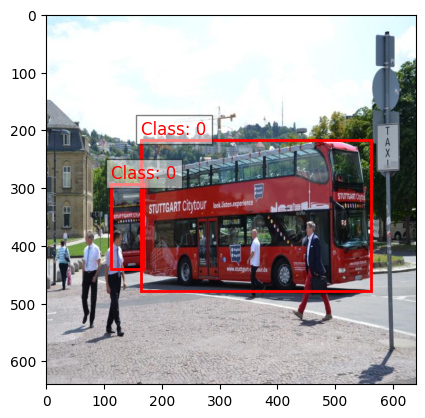

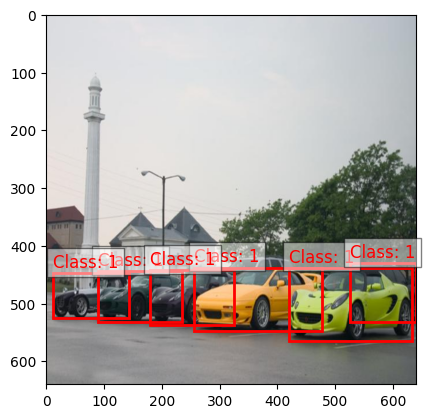

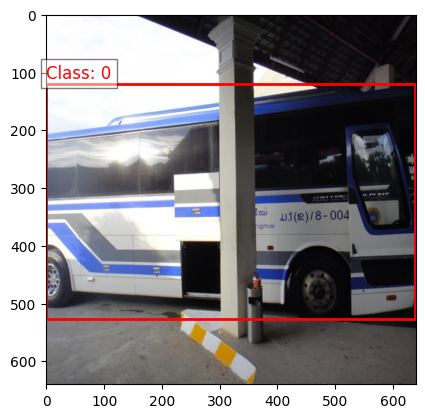

In [ ]:
def plot_bounding_box(dataframe, images_directory, row_index, image_id=None):

    if image_id:
        filtered_df = dataframe.query(f'image_id == "{image_id}"')

        image_path = os.path.join(images_directory, image_id)
        image = Image.open(image_path)

        # Create plot
        fig, ax = plt.subplots(1)
        ax.imshow(image)

        for index, row in filtered_df.iterrows():
            class_id = row['class']
            x1 = row['x1']
            y1 = row['y1']
            x2 = row['x2']
            y2 = row['y2']

            # Create a Rectangle patch
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            # Add the patch to the Axes
            ax.add_patch(rect)

            # Annotate class
            plt.text(x1, y1 - 10, f'Class: {class_id}', color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.show()

    else:
        if row_index is not None:
            # Extract row data
            row = dataframe.iloc[row_index]
            image_id = row['image_id']
            class_id = row['class']
            x1 = row['x1']
            y1 = row['y1']
            x2 = row['x2']
            y2 = row['y2']

            # Load image
            image_path = os.path.join(images_directory, image_id)
            image = Image.open(image_path)

            # Create plot
            fig, ax = plt.subplots(1)
            ax.imshow(image)

            # Create a Rectangle patch
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            # Add the patch to the Axes
            ax.add_patch(rect)

            # Annotate class
            plt.text(x1, y1 - 10, f'Class: {class_id}', color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

            plt.show()

print('Training dataset annotations:')
plot_bounding_box(dataframe=train_annotations, images_directory='/content/car-bus-1/train', row_index=None, image_id=train_annotations['image_id'][322])
plot_bounding_box(dataframe=train_annotations, images_directory='/content/car-bus-1/train', row_index=None, image_id=train_annotations['image_id'][120])
plot_bounding_box(dataframe=train_annotations, images_directory='/content/car-bus-1/train', row_index=None, image_id=train_annotations['image_id'][139])


In [ ]:
classes_labels = ['Bus', 'Car']
# indexes of each string element of above list correspondes to the class code.
# For example: 0 means bicycle, 1 means bus and so on.

In [ ]:

class CustomDataset(Dataset):
    def __init__(self, df, image_path, transform=None):
        self.data = df
        self.image_path = image_path
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_name = self.data.iloc[idx, 0]  # Assuming image name is in the first column
        image = Image.open(f"{self.image_path}/{image_name}").convert('RGB')

        # Example assuming bounding box coordinates and class label
        x1 = self.data.iloc[idx, 1]
        y1 = self.data.iloc[idx, 2]
        x2 = self.data.iloc[idx, 3]
        y2 = self.data.iloc[idx, 4]
        class_label = self.data.iloc[idx, 5]  # Adjust column index based on your data

        target = {}
        target['boxes'] = torch.tensor([[x1, y1, x2, y2]])
        target['labels'] = torch.tensor([class_label])

        if self.transform:
            image = self.transform(image)

        return image, target

def collate_fn(batch):
    images = [item[0] for item in batch]
    targets = [item[1] for item in batch]

    # Convert bounding box format if necessary
    # for i, target in enumerate(targets):
    #     targets[i]['boxes'] = box_convert(target['boxes'], 'xyxy', 'xywh')

    return images, targets

# Define data augmentation
data_transform = T.Compose([
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    T.RandomHorizontalFlip(p=0.5),
    T.ToTensor()
    # T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# DataLoaders
train_dl = DataLoader(
    CustomDataset(train_annotations, '/content/car-bus-1/train', transform=data_transform),
    batch_size=20,
    shuffle=True,
    collate_fn=collate_fn
)

valid_dl = DataLoader(
    CustomDataset(valid_annotations, '/content/car-bus-1/valid', transform=T.ToTensor()),  # No augmentation for validation
    batch_size=16,
    shuffle=False,
    collate_fn=collate_fn
)

In [ ]:
len(train_dl)

80

In [ ]:
len(valid_dl)

19

**FASTER R-CNN**

In [ ]:
# Model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')
num_classes = 6  # 5 classes + 1 background class
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 158MB/s]


In [ ]:
# # loading model weights from previous session
# state_dict = torch.load("/kaggle/input/pytorch-faster-cnn-on-custom-data/custom_model.pth")
# model.load_state_dict(state_dict)
# type(model)

In [ ]:
# Device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [ ]:
# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)  # Try Adam optimizer
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3)  # Reduce LR on Plateau

In [ ]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
num_epochs = 3  # Adjust number of epochs based on your needs

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for batch_idx, (images, targets) in enumerate(train_dl):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        start_time = time.time()  # Start timing the batch processing

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        train_loss += losses.item()

        end_time = time.time()  # End timing the batch processing
        batch_time = end_time - start_time

        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_dl)}], "
              f"Train Loss: {losses.item():.4f}, Time: {batch_time:.2f} seconds")

        # Cleanup tensors
        del images, targets, losses, loss_dict
        gc.collect()
        torch.cuda.empty_cache()

    # Adjust learning rate based on validation loss
    scheduler.step(train_loss)


Epoch [1/3], Batch [1/80], Train Loss: 2.2625, Time: 6.60 seconds
Epoch [1/3], Batch [2/80], Train Loss: 1.4906, Time: 3.62 seconds
Epoch [1/3], Batch [3/80], Train Loss: 0.9956, Time: 3.63 seconds
Epoch [1/3], Batch [4/80], Train Loss: 0.4663, Time: 3.71 seconds
Epoch [1/3], Batch [5/80], Train Loss: 0.2813, Time: 3.65 seconds
Epoch [1/3], Batch [6/80], Train Loss: 0.2931, Time: 3.99 seconds
Epoch [1/3], Batch [7/80], Train Loss: 0.2781, Time: 3.73 seconds
Epoch [1/3], Batch [8/80], Train Loss: 0.2568, Time: 3.75 seconds
Epoch [1/3], Batch [9/80], Train Loss: 0.2084, Time: 3.77 seconds
Epoch [1/3], Batch [10/80], Train Loss: 0.2201, Time: 3.70 seconds
Epoch [1/3], Batch [11/80], Train Loss: 0.1860, Time: 3.70 seconds
Epoch [1/3], Batch [12/80], Train Loss: 0.1658, Time: 3.74 seconds
Epoch [1/3], Batch [13/80], Train Loss: 0.2008, Time: 3.73 seconds
Epoch [1/3], Batch [14/80], Train Loss: 0.1673, Time: 3.80 seconds
Epoch [1/3], Batch [15/80], Train Loss: 0.1791, Time: 3.74 seconds
Epoc

In [ ]:
import gc

try:
  del imgs
except:
  pass

try:
  del targets
except:
  pass

try:
  del val_imgs
except:
  pass

try:
  del val_targets
except:
  pass

try:
  del losses
except:
  pass

try:
  del data
except:
  pass

try:
  del targ
except:
  pass

try:
  del d
except:
  pass


gc.collect()
torch.cuda.empty_cache()

In [ ]:
try:
    # Save the model
    torch.save(model.state_dict(), "custom_model.pth")
except:
    pass

In [ ]:
test_dl = DataLoader(
    CustomDataset(test_annotations, '/content/car-bus-1/test', transform=T.ToTensor()),  # No augmentation for validation
    batch_size=16,
    shuffle=False,
    collate_fn=collate_fn
)

In [ ]:
# model.to(device)

model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
data_loader = test_dl

all_preds = []
all_labels = []

with torch.no_grad():
    for images, targets in tqdm(data_loader, desc="Working"):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        outputs = model(images)

        # Extract predictions and labels from outputs
        for i, output in enumerate(outputs):
            # Convert predicted boxes to xywh format
            output['boxes'] = output['boxes'].cpu().numpy()
            output['labels'] = output['labels'].cpu().numpy()

            # Get target labels
            target_labels = targets[i]['labels'].cpu().numpy()

            # Create ground truth and prediction arrays
            # We'll assume the model predicts at most one object per image for now
            # This will need to be adapted if your model can predict multiple objects
            if len(output['boxes']) > 0:
                pred_label = output['labels'][0]
                pred_boxes = output['boxes'][0]

                all_preds.append(pred_label)
                all_labels.append(target_labels)
            else:
                all_preds.append(-1)  # Placeholder for no prediction
                all_labels.append(target_labels)

            # Cleanup tensors
            del i, output, target_labels
            gc.collect()
            torch.cuda.empty_cache()

        # Cleanup tensors
        del images, targets, outputs
        gc.collect()
        torch.cuda.empty_cache()

Working: 100%|██████████| 17/17 [01:40<00:00,  5.93s/it]


In [ ]:
def evaluate_model(model, data_loader, num_classes, all_preds, all_labels):
    # Calculate evaluation metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average=None, zero_division=0)
    recall = recall_score(all_labels, all_preds, average=None, zero_division=0)
    f1 = f1_score(all_labels, all_preds, average=None, zero_division=0)

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1
    }

# Run the evaluation
evaluation_results = evaluate_model(model, test_dl, num_classes, all_preds, all_labels)

# Print the results
print("Evaluation Results:\n")

table_data = [
    ["Metric", "Precision", "Recall", "F1 Score"],
    ["Bus"] + [f"{p:.4f}" for p in evaluation_results['precision'][0:1]] +
                 [f"{r:.4f}" for r in evaluation_results['recall'][0:1]] +
                 [f"{f:.4f}" for f in evaluation_results['f1_score'][0:1]],
    ["Car"] + [f"{p:.4f}" for p in evaluation_results['precision'][1:2]] +
              [f"{r:.4f}" for r in evaluation_results['recall'][1:2]] +
              [f"{f:.4f}" for f in evaluation_results['f1_score'][1:2]]
]
print(f"Accuracy: {evaluation_results['accuracy']:.4f}")
print(tabulate(table_data, headers="firstrow", tablefmt="grid"))

Evaluation Results:

Accuracy: 0.7353
+----------+-------------+----------+------------+
| Metric   |   Precision |   Recall |   F1 Score |
+==========+=============+==========+============+
| Bus      |      0      |        0 |     0      |
+----------+-------------+----------+------------+
| Car      |      0.7353 |        1 |     0.8475 |
+----------+-------------+----------+------------+


In [ ]:
del all_preds, all_labels
gc.collect()
torch.cuda.empty_cache()

In [ ]:
def plot_detections(image, outputs, classes):
    """Plots bounding boxes and labels on an image."""
    plt.imshow(image)
    ax = plt.gca()

    for box_idx in range(len(outputs['boxes'])):
        box = outputs['boxes'][box_idx].detach().cpu().numpy()
        label = classes[outputs['labels'][box_idx]]  # Use class label from the list

        # Draw bounding box
        ax.add_patch(plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, edgecolor='red', linewidth=2))

        # Add label
        ax.text(box[0], box[1] - 10, label, fontsize=10, bbox={'facecolor': 'white', 'alpha': 0.5})

    plt.show()

def make_inference(model, image_path, device):
    """Performs inference on a single image and plots the results.

    Args:
        model: The trained Faster R-CNN model.
        image_path: The path to the image file.
        classes_labels: A list of class labels.
        device: The device (CPU or GPU) to use for inference.
    """

    classes_labels = ['bus', 'car']

    # Load the image
    image = Image.open(image_path).convert('RGB')

    # Preprocess the image (make sure this matches your training pipeline)
    transform = T.Compose([
        T.ToTensor()
    ])
    image = transform(image).unsqueeze(0).to(device)

    # Make predictions
    with torch.no_grad():
        outputs = model(image)

    # Plot the results
    image_np = image[0].cpu().permute(1, 2, 0).numpy()
    plot_detections(image_np, outputs[0], classes_labels)

In [ ]:
def choose_random_files(directory, num_files=3):
    # Get list of all files in the directory
    files = os.listdir(directory)

    # Filter out directories (if any)
    files = [f for f in files if os.path.isfile(os.path.join(directory, f))]

    # Choose randomly from the list of files
    chosen_files = random.sample(files, num_files)

    # Create full paths and return as a list
    full_paths = [os.path.join(directory, file) for file in chosen_files]

    return full_paths

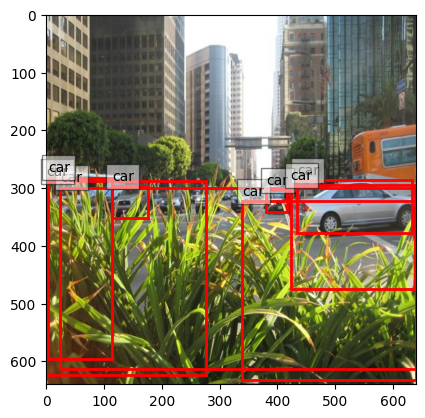

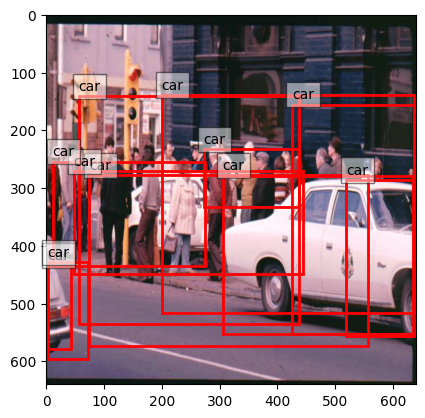

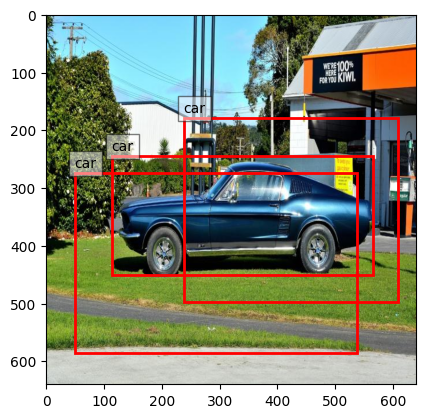

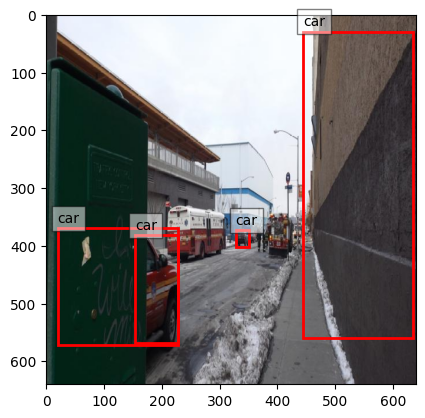

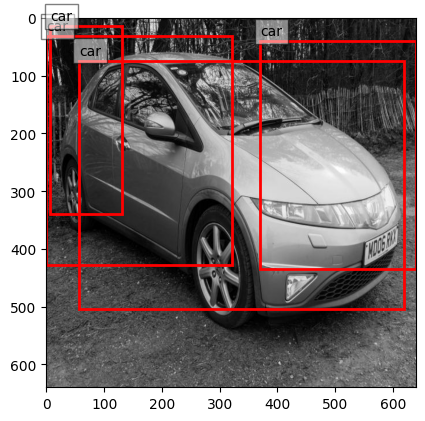

...

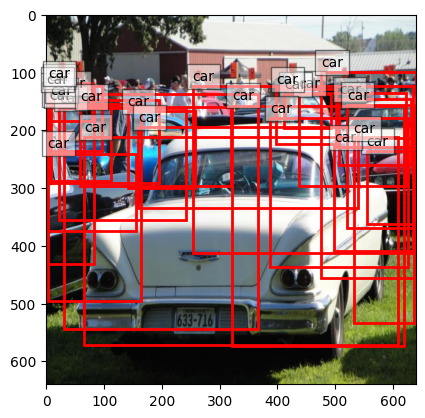

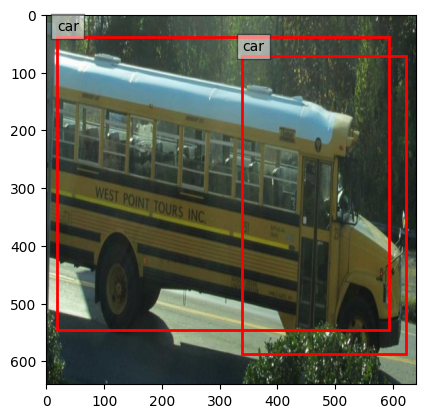

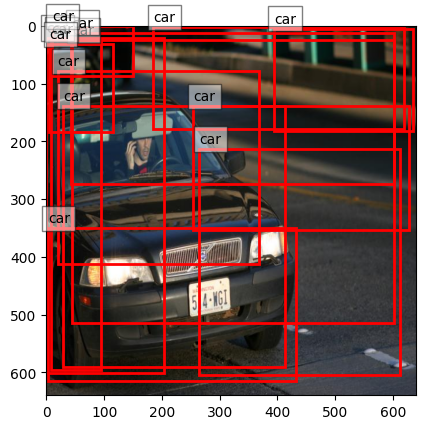

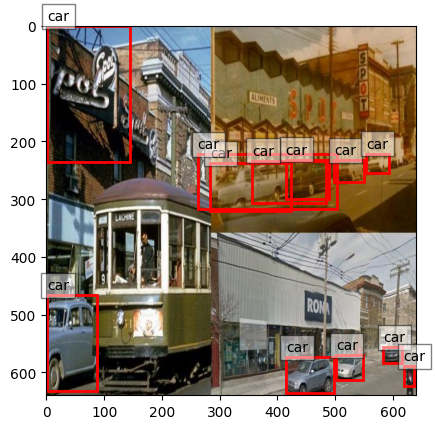

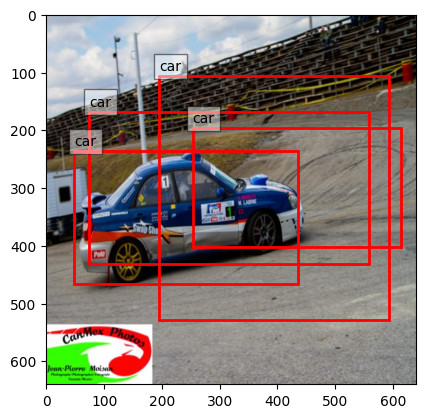

In [ ]:
for image_path in choose_random_files('/content/car-bus-1/test', num_files=50):
    make_inference(model, image_path, device)

**YOLO V11**

In [ ]:
!pip install ultralytics

from ultralytics import YOLO
model_YOLO = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.8/906.8 kB 25.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 102MB/s]


In [ ]:
model_YOLO.train(data="/content/car-bus-1/data.yaml", epochs=3, imgsz = 640, batch =16)


Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/car-bus-1/data.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

100%|██████████| 755k/755k [00:00<00:00, 17.7MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:1

AMP: checks passed ✅


train: Scanning /content/car-bus-1/train/labels... 750 images, 24 backgrounds, 0 corrupt: 100%|██████████| 750/750 [00:01<00:00, 727.11it/s]


train: New cache created: /content/car-bus-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/car-bus-1/valid/labels... 150 images, 5 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 1736.51it/s]

val: New cache created: /content/car-bus-1/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/47 [00:00<?, ?it/s]Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG

                   all        150        297      0.952     0.0638      0.494      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/47 [00:00<?, ?it/s]Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG

                   all        150        297      0.681      0.433      0.548      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/47 [00:00<?, ?it/s]Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG

                   all        150        297      0.717      0.689      0.747       0.58



3 epochs completed in 0.018 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:1

YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]


                   all        150        297       0.72      0.689      0.747       0.58
                   Bus         82        109      0.721      0.771       0.82      0.665
                   Car         94        188      0.718      0.606      0.674      0.494
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 8.1ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c5b79d3f400>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
metrics = model_YOLO.val(split='val')

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")
print("recall : ",metrics.box.r)
print(metrics.box.f1)
print(metrics.box.maps)

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:1

                   all        150        297      0.717      0.689      0.747      0.578
                   Bus         82        109      0.721      0.771      0.819      0.662
                   Car         94        188      0.713      0.606      0.675      0.494
Speed: 0.3ms preprocess, 5.9ms inference, 0.0ms loss, 7.7ms postprocess per image
Results saved to runs/detect/train22
Mean Average Precision @.5:.95 : 0.5778947491127053
Mean Average Precision @ .50   : 0.7470285910180574
Mean Average Precision @ .70   : 0.6461753006989093
recall :  [    0.77064     0.60638]
[    0.74489     0.65521]
[    0.66191     0.49388]



image 1/1 /content/car-bus-1/train/1241bdde7088e7d6_jpg.rf.7bcfbe725f17e53ed5f85638dcea3b72.jpg: 640x640 4 Cars, 12.5ms
Speed: 2.2ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:1

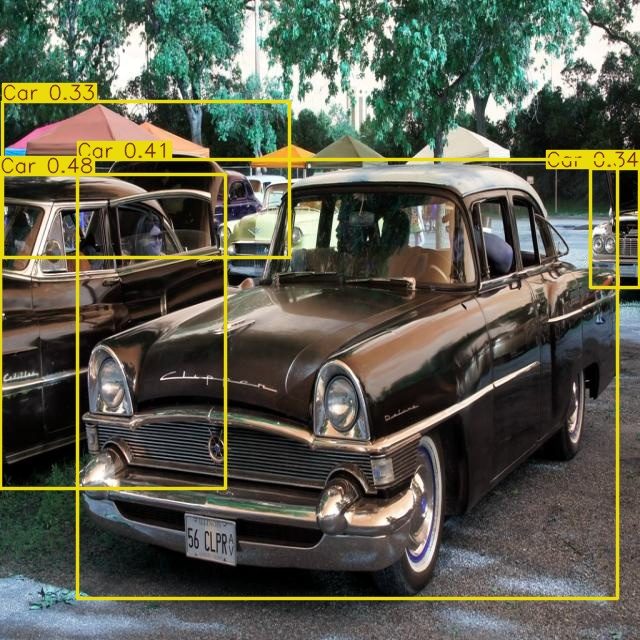


image 1/1 /content/car-bus-1/train/9bfe1b13b5237735_jpg.rf.62afb52a1b71c069e5ef70f34097f2bd.jpg: 640x640 2 Buss, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


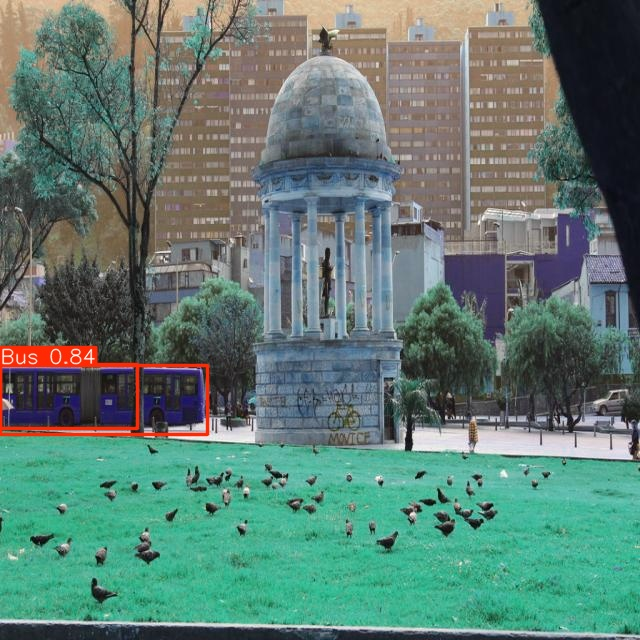


image 1/1 /content/car-bus-1/train/b3ceea3f9e7824f7_jpg.rf.913561c4188255d800bc715b6e09b722.jpg: 640x640 2 Cars, 17.9ms
Speed: 2.2ms preprocess, 17.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


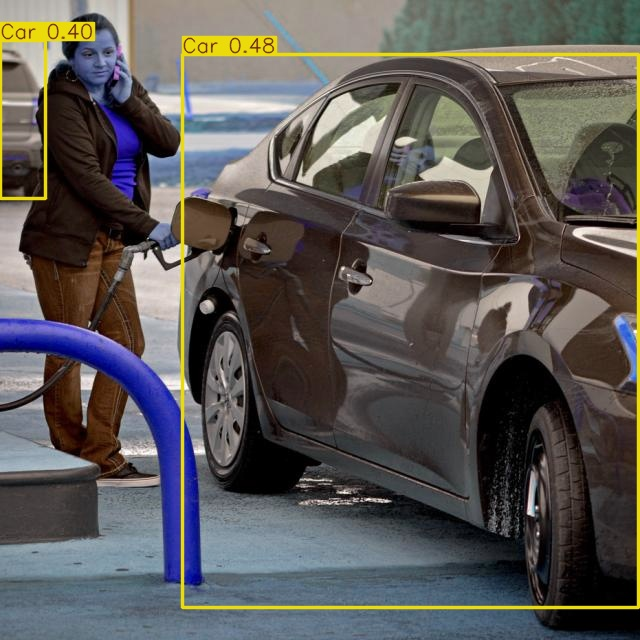


image 1/1 /content/car-bus-1/train/587efc1dabff8424_jpg.rf.79d94d8bb4e8ef2573fe6b155897c837.jpg: 640x640 1 Bus, 12.4ms
Speed: 2.0ms preprocess, 12.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


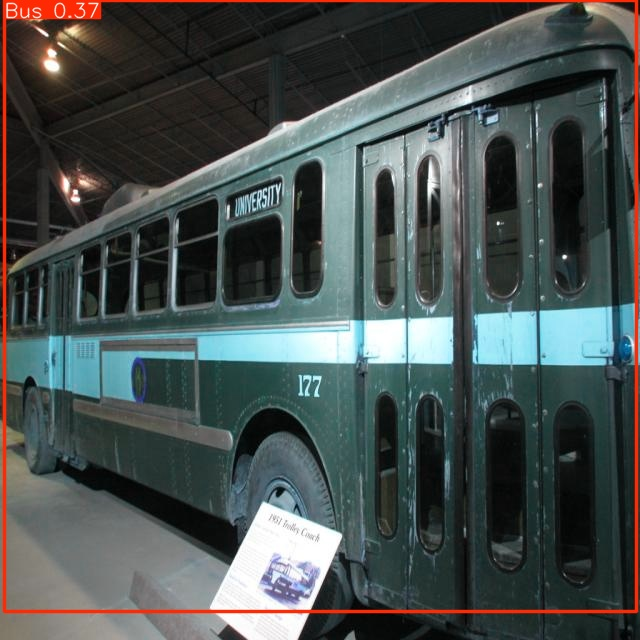


image 1/1 /content/car-bus-1/train/30853ddbb04af70d_jpg.rf.d6c76729f50e51518612ecdeff45aa87.jpg: 640x640 1 Bus, 2 Cars, 11.8ms
Speed: 2.0ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


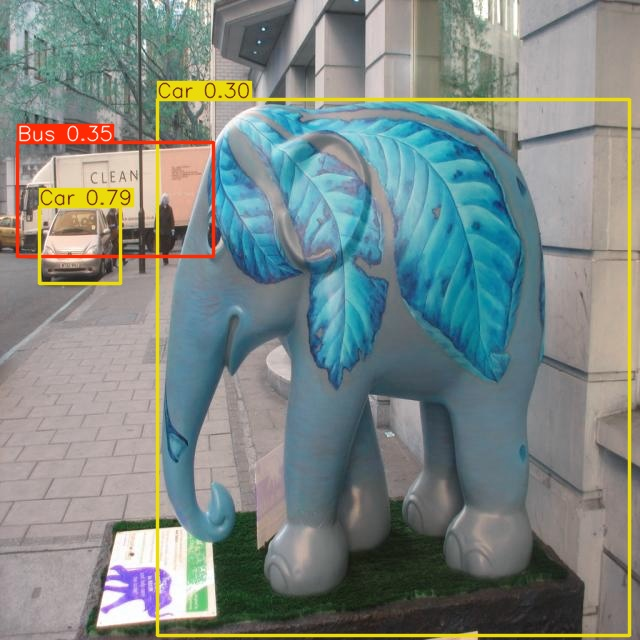

In [ ]:
import os
from ultralytics import YOLO  # Pastikan YOLO framework terpasang
from IPython.display import Image, display
import cv2

# Path ke folder berisi gambar
path = '/content/car-bus-1/train'

# Ambil gambar dengan ekstensi tertentu
image_files = [f for f in os.listdir(path) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Batasi hanya 5 gambar
image_files = image_files[:5]

# Muat model YOLO yang telah dilatih sebelumnya
model = model_YOLO  # Ganti dengan path model Anda

# Lakukan prediksi untuk setiap gambar
for img_name in image_files:
    img_path = os.path.join(path, img_name)

    # Prediksi menggunakan model YOLO
    results = model(img_path)  # Lakukan prediksi

    # Proses setiap hasil prediksi
    for result in results:  # Iterate melalui hasil (biasanya hanya 1 per gambar)
        # Render hasil prediksi ke gambar
        rendered_image = result.plot()  # Plot dengan bounding box

        # Simpan gambar hasil prediksi
        output_img_path = f"{path}/predicted_{img_name}"
        cv2.imwrite(output_img_path, cv2.cvtColor(rendered_image, cv2.COLOR_RGB2BGR))  # Konversi RGB ke BGR

        # Tampilkan gambar hasil prediksi
        display(Image(filename=output_img_path))



image 1/1 /content/lalulintas-jakarta-130813a.jpg: 384x640 1 Bus, 12 Cars, 165.9ms
Speed: 8.2ms preprocess, 165.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:1

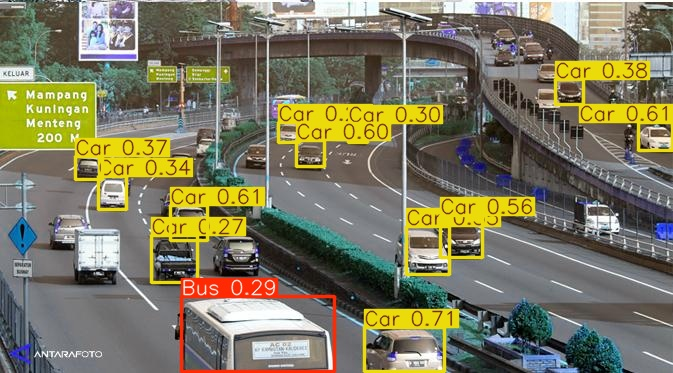

In [ ]:
import cv2
from ultralytics import YOLO  # Pastikan YOLO framework terpasang
from IPython.display import Image, display

# Path ke gambar
img_path = '/content/lalulintas-jakarta-130813a.jpg'  # Ganti dengan path ke gambar Anda

# Muat model YOLO yang telah dilatih sebelumnya
model = model_YOLO  # Ganti dengan path model Anda

# Lakukan prediksi pada gambar
results = model(img_path)

# Render hasil prediksi
result = results[0]  # Ambil hasil pertama (karena hanya ada satu gambar)
rendered_image = result.plot()  # Render bounding box

# Simpan gambar hasil prediksi
output_img_path = 'predicted_sample_image.jpg'
cv2.imwrite(output_img_path, cv2.cvtColor(rendered_image, cv2.COLOR_RGB2BGR))  # Simpan gambar

# Tampilkan gambar hasil prediksi
display(Image(filename=output_img_path))
